In [25]:
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse 
import numpy as np
import pandas as pd
from pandas.plotting import scatter_matrix as sm
from scipy.spatial.distance import cdist
import seaborn as sns
from sklearn import preprocessing
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from sklearn.metrics.cluster import adjusted_rand_score
import os
from sklearn.cluster import KMeans

In this project, we'll utilize custom functions to visualize the results of 2-D K-Means clustering. We'll work with the Wine Dataset, which contains the outcomes of a chemical analysis of wines cultivated in a specific region of Italy. The attributes encompass various chemical properties such as alcohol content, malic acid concentration, ash levels, alkalinity of ash, magnesium content, total phenols, flavanoids, nonflavanoid phenols, proanthocyanins, color intensity, hue, OD280/OD315 ratio of diluted wines, and proline content. Additionally, the dataset includes a variable label denoting the true classifications of the different wine samples.

In [26]:
wine = pd.read_csv("wine.data_W2.csv")
print(wine['Label'].unique())
wine.head()

[1 2 3]


,Label,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735


In [27]:
# True labels
label = wine['Label']
del wine['Label']

# Data description
print("Types of variables:\n")
print(wine.dtypes)

print("\nData Description:")
print(wine.describe())

Types of variables:

Alcohol                 float64
Malic acid              float64
Ash                     float64
Alcalinity of ash       float64
Magnesium                 int64
Total phenols           float64
Flavanoids              float64
Nonflavanoid phenols    float64
Proanthocyanins         float64
Color intensity         float64
Hue                     float64
OD280                   float64
Proline                   int64
dtype: object

Data Description:
          Alcohol  Malic acid         Ash  Alcalinity of ash   Magnesium  \
count  178.000000  178.000000  178.000000         178.000000  178.000000   
mean    13.000618    2.336348    2.366517          19.494944   99.741573   
std      0.811827    1.117146    0.274344           3.339564   14.282484   
min     11.030000    0.740000    1.360000          10.600000   70.000000   
25%     12.362500    1.602500    2.210000          17.200000   88.000000   
50%     13.050000    1.865000    2.360000          19.500000   98.000000  

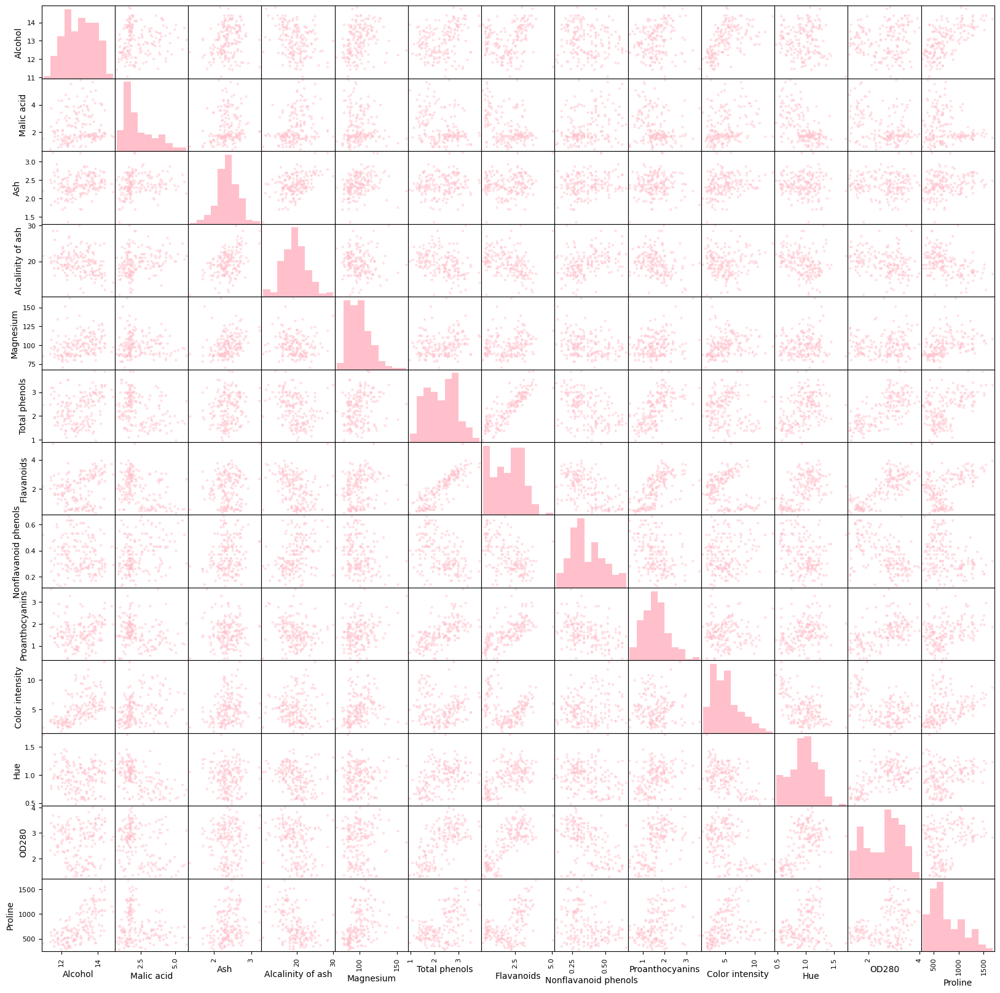

In [28]:
# Scatter plot
scatter = pd.plotting.scatter_matrix(wine, figsize=(20, 20), color='pink', hist_kwds={'color': 'pink'})
plt.show()

Hard to cluster the data from Scatter Plot.

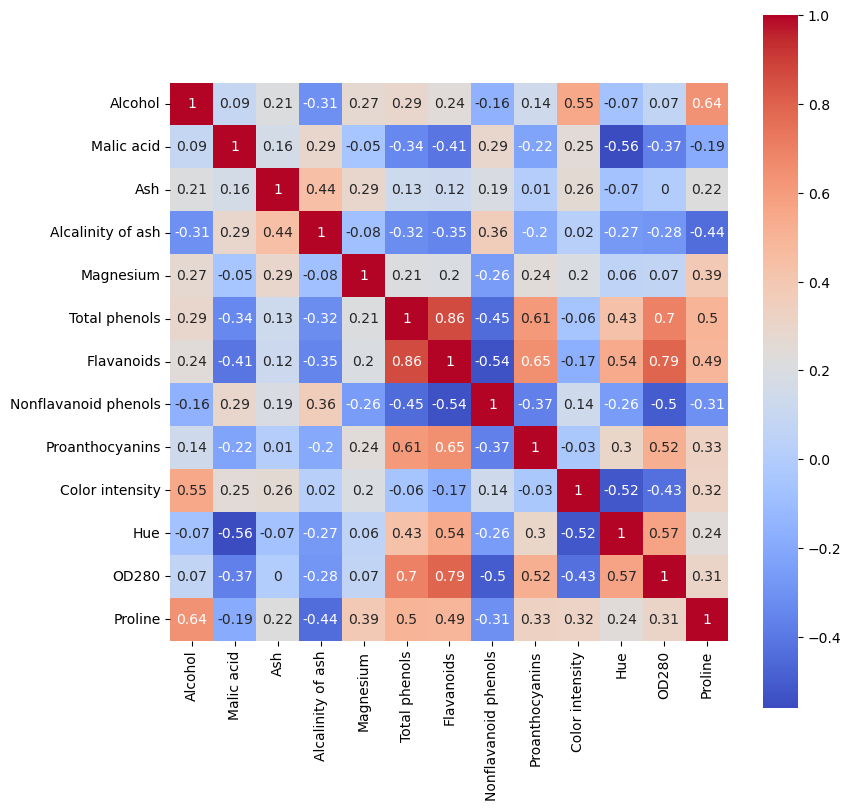

In [29]:
# Correlation Heatmap
correlation = wine.corr()
plt.subplots(figsize=(9, 9))
sns.heatmap(correlation.round(2), 
            annot=True, 
            vmax=1, 
            square=True, 
            cmap='coolwarm')
plt.show()

Based on the heatmap analysis:

There is a significant correlation between "Flavanoids" and "Total phenols" (correlation coefficient: 0.86).
Additionally, a notable correlation is observed between "OD280" and "Flavanoids" (correlation coefficient: 0.79).
Moreover, a considerable correlation exists between "OD280" and "Total phenols" (correlation coefficient: 0.7).

Given these findings, we can proceed to visualize the regression of "Flavanoids" on "Total phenols" as follows:

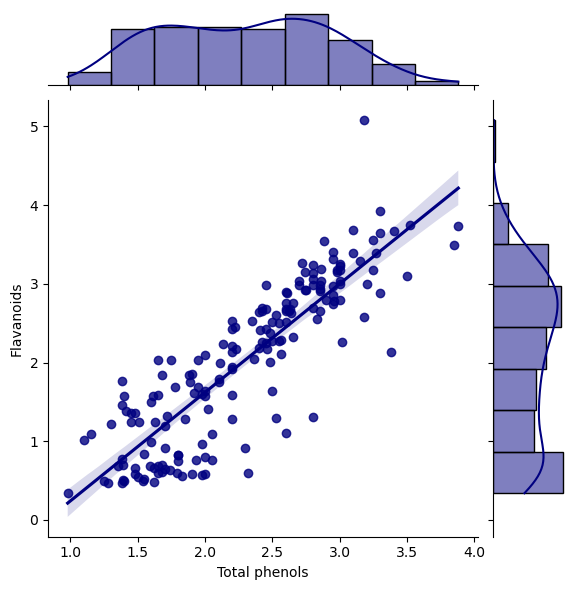

In [30]:
sns.jointplot(x=wine['Total phenols'], 
              y=wine['Flavanoids'], 
              data=wine, 
              kind="reg",
              color='navy')
plt.show()

K-Means Clustering

In [31]:
!pip show seaborn
!pip show matplotlib

Name: seaborn
Version: 0.12.2
Summary: Statistical data visualization
Home-page: 
Author: 
Author-email: Michael Waskom <mwaskom@gmail.com>
License: 
Location: C:\Users\91987\anaconda3\Lib\site-packages
Requires: matplotlib, numpy, pandas
Required-by: 
Name: matplotlib
Version: 3.7.1
Summary: Python plotting package
Home-page: https://matplotlib.org
Author: John D. Hunter, Michael Droettboom
Author-email: matplotlib-users@python.org
License: PSF
Location: C:\Users\91987\anaconda3\Lib\site-packages
Requires: contourpy, cycler, fonttools, kiwisolver, numpy, packaging, pillow, pyparsing, python-dateutil
Required-by: seaborn


K-Means

In [32]:
# Set the environment variable to avoid memory leak warning on Windows with MKL
os.environ['OMP_NUM_THREADS'] = '1'

# Define the KMeans model with explicit n_init parameter
KM = KMeans(n_clusters=3, random_state=0, n_init=10)

# Fit the model and predict clusters
res = KM.fit_predict(wine)

# Get predicted labels and centroids
label_pred_KM = KM.labels_
print("Labels predicted by K-Means:", label_pred_KM)
print('Length of labels is same as data entry', label_pred_KM.shape)

centroids_KM = KM.cluster_centers_
print("Shape of centroids_KM", centroids_KM.shape)
print("Centroids:", centroids_KM)

inertia_KM = KM.inertia_
print("Inertia:", inertia_KM)

C:\Users\91987\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Labels predicted by K-Means: [1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 1 1 0 0 1 1 0 1 1 1 1 1 1 0 0
 1 1 0 0 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 0 2 0 2 2 0 2 2 0 0 0 2 2 1
 0 2 2 2 0 2 2 0 0 2 2 2 2 2 0 0 2 2 2 2 2 0 0 2 0 2 0 2 2 2 0 2 2 2 2 0 2
 2 0 2 2 2 2 2 2 2 0 2 2 2 2 2 2 2 2 2 0 2 2 0 0 0 0 2 2 2 0 0 2 2 0 0 2 0
 0 2 2 2 2 0 0 0 2 0 0 0 2 0 2 0 0 2 0 0 0 0 2 2 0 0 0 0 0 2]
Length of labels is same as data entry (178,)
Shape of centroids_KM (3, 13)
Centroids: [[1.29298387e+01 2.50403226e+00 2.40806452e+00 1.98903226e+01
  1.03596774e+02 2.11112903e+00 1.58403226e+00 3.88387097e-01
  1.50338710e+00 5.65032258e+00 8.83967742e-01 2.36548387e+00
  7.28338710e+02]
 [1.38044681e+01 1.88340426e+00 2.42617021e+00 1.70234043e+01
  1.05510638e+02 2.86723404e+00 3.01425532e+00 2.85319149e-01
  1.91042553e+00 5.70255319e+00 1.07829787e+00 3.11404255e+00
  1.19514894e+03]
 [1.25166667e+01 2.49420290e+00 2.28855072e+00 2.08231884e+01
  9.23478261e+01 2.07072464e+00 1.75840580e+00 3.901

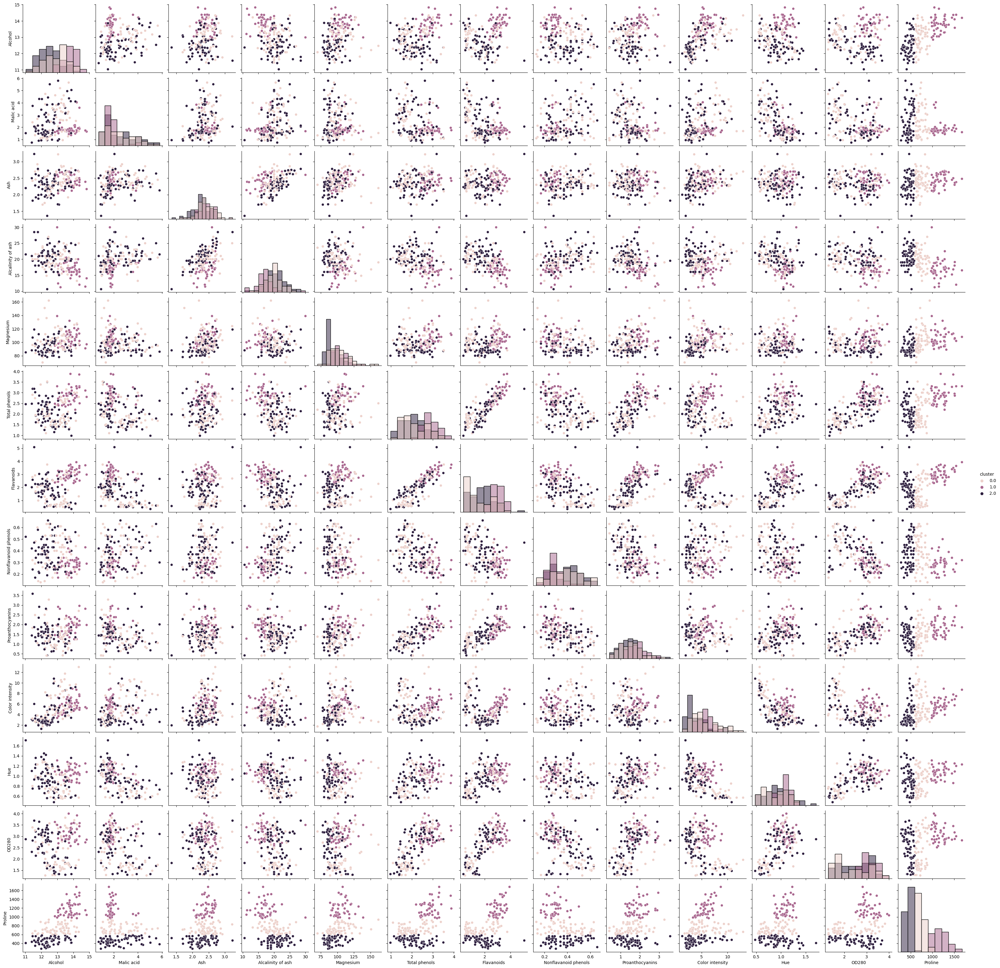

In [33]:
# Pairplot
wine ["cluster"] = label_pred_KM.astype('float64')
sns_plot = sns.pairplot(wine, hue = "cluster",diag_kind="hist")

In [34]:
wine.head()

,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280,Proline,cluster
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,1.0
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,1.0
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,1.0
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,1.0
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,0.0


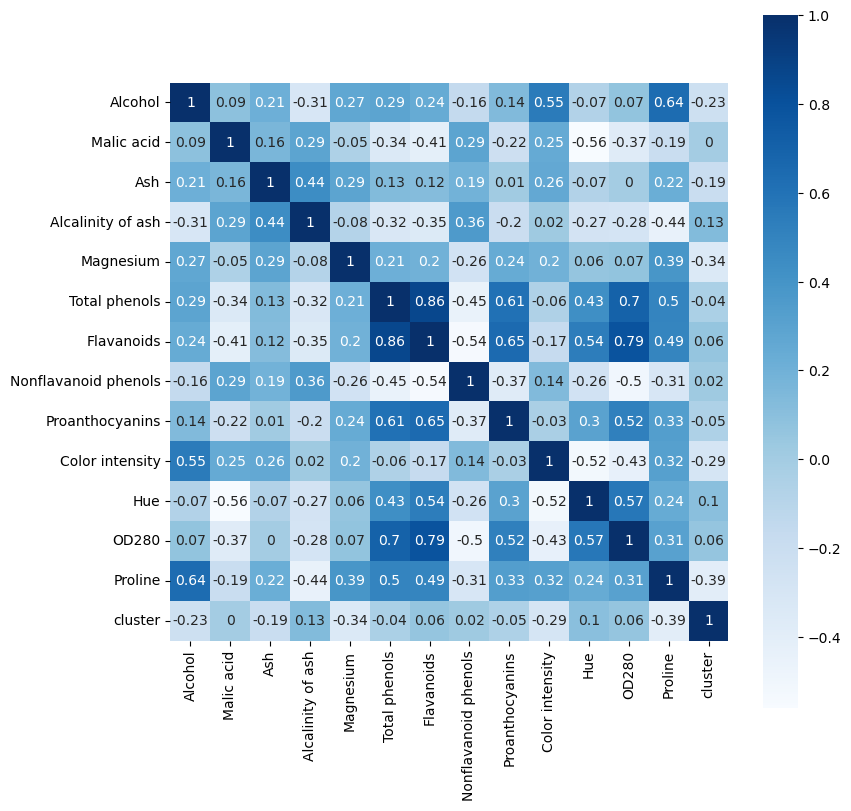

In [36]:
# Visualize the correlation matrix for alcohols in cluster 1
correlation = wine.corr()
plt.subplots(figsize=(9, 9))
sns.heatmap(correlation.round(2), 
            annot=True, 
            vmax=1, 
            square=True, 
            cmap='Blues')
plt.show()


Normalization

In [37]:
standardScaler = preprocessing.StandardScaler()
standardScaler.fit(wine)
X_scaled_array = standardScaler.transform(wine)
normalize = pd.DataFrame(X_scaled_array, columns = wine.columns)
normalize.head()

,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280,Proline,cluster
0,1.518613,-0.562250,0.232053,-1.169593,1.913905,0.808997,1.034819,-0.659563,1.224884,0.251717,0.362177,1.847920,1.013009,-0.045889
1,0.246290,-0.499413,-0.827996,-2.490847,0.018145,0.568648,0.733629,-0.820719,-0.544721,-0.293321,0.406051,1.113449,0.965242,-0.045889
2,0.196879,0.021231,1.109334,-0.268738,0.088358,0.808997,1.215533,-0.498407,2.135968,0.269020,0.318304,0.788587,1.395148,-0.045889
3,1.691550,-0.346811,0.487926,-0.809251,0.930918,2.491446,1.466525,-0.981875,1.032155,1.186068,-0.427544,1.184071,2.334574,-0.045889
4,0.295700,0.227694,1.840403,0.451946,1.281985,0.808997,0.663351,0.226796,0.401404,-0.319276,0.362177,0.449601,-0.037874,-1.212782


In [38]:
KM = KMeans(n_clusters = 3, random_state=0)
res = KM.fit_predict(normalize)

label_pred_KM = KM.labels_
print("Labels predicted by K-Means:",label_pred_KM)
print('Length of labels is same as data entry', label_pred_KM.shape)

centroids_KM= KM.cluster_centers_
print("Shape of centroids_KM",centroids_KM.shape)
print("Centroids:",centroids_KM)

inertia_KM = KM.inertia_
print("Inertia:",inertia_KM)

C:\Users\91987\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\91987\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Labels predicted by K-Means: [2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 2 1 1 0 2 0 1 1 2
 2 1 1 1 2 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Length of labels is same as data entry (178,)
Shape of centroids_KM (3, 14)
Centroids: [[ 0.17023606  0.83212029  0.22775214  0.55145199 -0.03004061 -0.97995865
  -1.22194075  0.71974369 -0.76493391  0.91668717 -1.14362619 -1.29130383
  -0.35726    -0.29757193]
 [-0.9442223  -0.30089738 -0.43909202  0.24420764 -0.62643647 -0.09907804
   0.05290659  0.06035562 -0.02799978 -0.88587129  0.4168392   0.30048427
  -0.8574374   0.66189867]
 [ 0.74114426 -0.36489992  0.22983718 -0.65182905  0.60219235  0.84881291
   0.89532843 -0.61194881  0.61696388  0.11041066  0.49845068  0.72010538
   1.06854457 -0.3818128

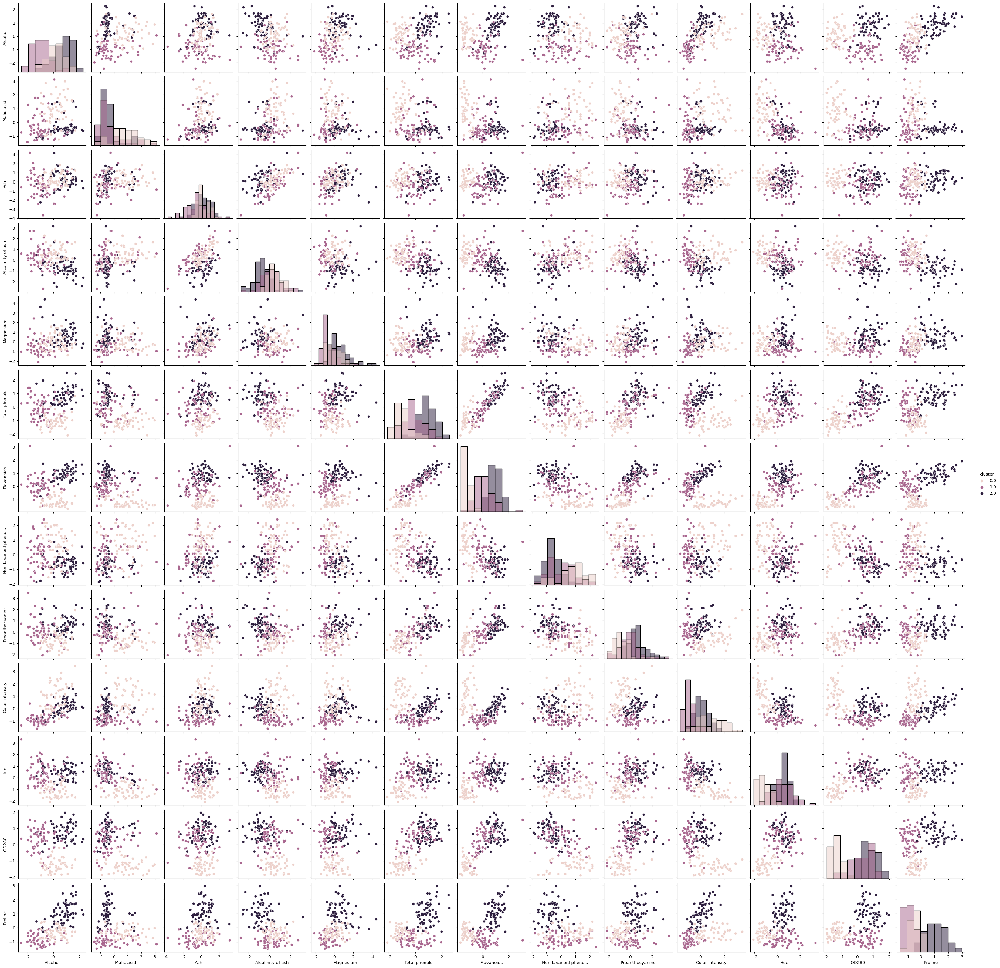

In [39]:
# Pairplot
normalize ["cluster"] = label_pred_KM.astype('float64')
sns_plot = sns.pairplot(normalize, hue = "cluster",diag_kind="hist")

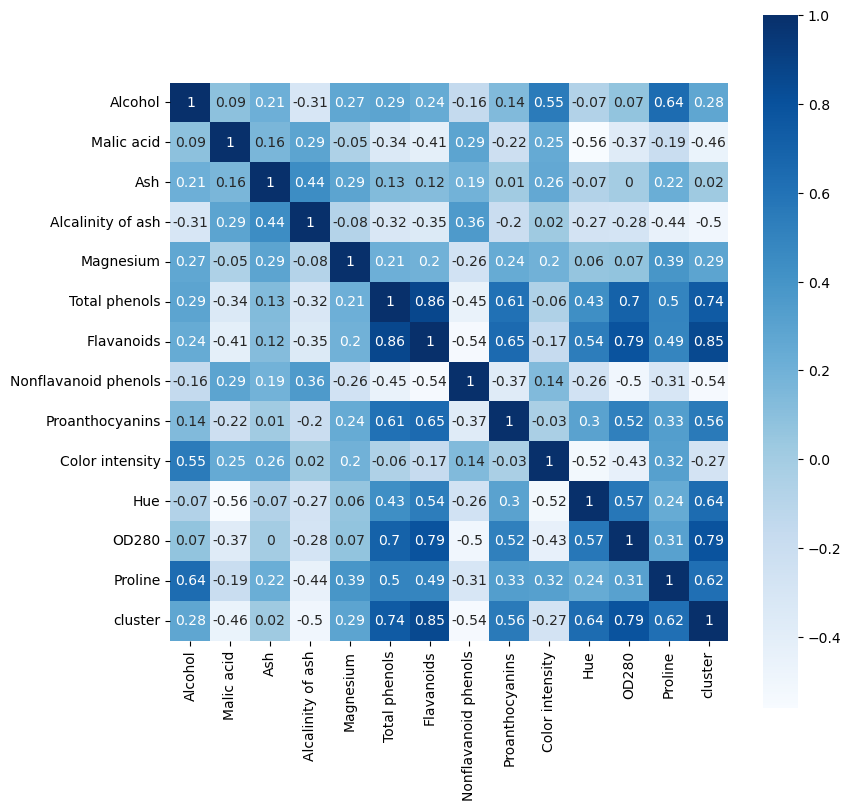

In [40]:
# Visualize the correlation matrix for alcohols in cluster 1
correlation = normalize.corr()
plt.subplots(figsize=(9, 9))
sns.heatmap(correlation.round(2), 
            annot=True, 
            vmax=1, 
            square=True, 
            cmap='Blues')
plt.show()
